# Deep Learning Project

## Automatic Image Tagging for Fashion E-commerce  

Saman Zargarzadeh, Devy Yeap, Tiantian Gu, Tannaz Ebrahimi, Xia-Rong Zhang

### Explain the problem:

This dataset contains a large number of images and corresponding fashion/apparel segmentations.
For this step of project we made a dataset which has three columns:

“ImageId” - the unique ID of an image

“SetClassID” - the identified attributes ID’s of the image, such as “shirt, blouse”, “sweater”, etc

“Class” -  1 if identified attributes contain “dress”, else 0.

Thus the binary outcome variable is “Class” - if the identified attributes of the image contain “dress”, then it’s class 1; else class 0.

In [1]:
import matplotlib.pyplot as plt
import matplotlib.image as mpimg

In [2]:
import os
import gc
import sys
import json
import random
from pathlib import Path
import pandas as pd
import numpy as np

In [3]:
df = pd.read_csv('/Users/macbook/Desktop/Uni/Quarter 4/Deep Learning/Project/imaterialist-fashion-2020-fgvc7/train.csv')

In [4]:
with open('/Users/macbook/Desktop/Uni/Quarter 4/Deep Learning/Project/imaterialist-fashion-2020-fgvc7/label_descriptions.json', 'r') as file:
    label_desc = json.load(file)
sample_sub_df = pd.read_csv('/Users/macbook/Desktop/Uni/Quarter 4/Deep Learning/Project/imaterialist-fashion-2020-fgvc7/sample_submission.csv')


In [5]:
categories_df = pd.DataFrame(label_desc['categories'])
attributes_df = pd.DataFrame(label_desc['attributes'])
categories_df

,id,name,supercategory,level
0,0,"shirt, blouse",upperbody,2
1,1,"top, t-shirt, sweatshirt",upperbody,2
2,2,sweater,upperbody,2
3,3,cardigan,upperbody,2
4,4,jacket,upperbody,2
5,5,vest,upperbody,2
6,6,pants,lowerbody,2
7,7,shorts,lowerbody,2
8,8,skirt,lowerbody,2
9,9,coat,wholebody,2


In [6]:
df["Ratio"]=df["Height"]/df["Width"]
df.head()

,ImageId,EncodedPixels,Height,Width,ClassId,AttributesIds,Ratio
0,00000663ed1ff0c4e0132b9b9ac53f6e,6068157 7 6073371 20 6078584 34 6083797 48 608...,5214,3676,6,"115,136,143,154,230,295,316,317",1.41839
1,00000663ed1ff0c4e0132b9b9ac53f6e,6323163 11 6328356 32 6333549 53 6338742 75 63...,5214,3676,0,"115,136,142,146,225,295,316,317",1.41839
2,00000663ed1ff0c4e0132b9b9ac53f6e,8521389 10 8526585 30 8531789 42 8537002 46 85...,5214,3676,28,163,1.41839
3,00000663ed1ff0c4e0132b9b9ac53f6e,12903854 2 12909064 7 12914275 10 12919485 15 ...,5214,3676,31,"160,204",1.41839
4,00000663ed1ff0c4e0132b9b9ac53f6e,10837337 5 10842542 14 10847746 24 10852951 33...,5214,3676,32,219,1.41839


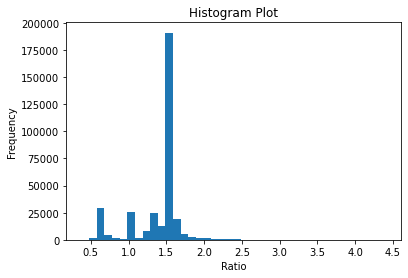

In [7]:
# create the histogram plot
plt.hist(df["Ratio"], bins=40)

# add labels and title
plt.xlabel('Ratio')
plt.ylabel('Frequency')
plt.title('Histogram Plot')

# show the plot
plt.show()

In [8]:
(df["Ratio"]).mean()

1.3736954977652924

In [9]:
(df["Ratio"]).mode()[0]

1.5

In [10]:
pd.DataFrame((df["Ratio"]).value_counts()).head()

,Ratio
1.500000,78784
1.000000,24422
1.499250,15896
1.333333,12550
0.666667,10521


In [11]:
ratio_df = df.groupby('ImageId')['Ratio'].mean().reset_index()
ratio_df.head()

,ImageId,Ratio
0,00000663ed1ff0c4e0132b9b9ac53f6e,1.418390
1,0000fe7c9191fba733c8a69cfaf962b7,1.000000
2,0002ec21ddb8477e98b2cbb87ea2e269,1.502253
3,0002f5a0ebc162ecfb73e2c91e3b8f62,1.417500
4,0004467156e47b0eb6de4aa6479cbd15,1.500000


In [12]:
image_df = df.groupby('ImageId')['AttributesIds', 'ClassId'].agg(lambda x: list(x))
image_df.reset_index(inplace=True)
image_df['ImageId'] = image_df['ImageId'].astype('str')

/var/folders/s5/4b25bvq14pqbm1qxsg0hhlr40000gn/T/ipykernel_9334/700136001.py:1: FutureWarning: Indexing with multiple keys (implicitly converted to a tuple of keys) will be deprecated, use a list instead.
  image_df = df.groupby('ImageId')['AttributesIds', 'ClassId'].agg(lambda x: list(x))


In [13]:
names = ["shirt, blouse","top, t-shirt, sweatshirt","sweater","cardigan",
"jacket","vest","pants","shorts","skirt","coat","dress","jumpsuit","cape",
"glasses","hat","headband, head covering, hair accessory","tie","glove",
"watch","belt","leg warmer","tights, stockings","sock","shoe","bag, wallet",
"scarf","umbrella","hood","collar","lapel","epaulette","sleeve","pocket","neckline",
"buckle","zipper","applique","bead","bow","flower","fringe","ribbon","rivet","ruffle",
"sequin","tassel"]

In [14]:
set_cls= []
for i in range(len(image_df)):
    classes = list(set(image_df['ClassId'].iloc[i]))
    set_cls.append(classes)
    
image_df['SetClassId'] = set_cls
image_df.drop(['AttributesIds','ClassId'],axis=1,inplace=True)

In [15]:
image_df=image_df.merge(ratio_df, on='ImageId')
image_df.head()

,ImageId,SetClassId,Ratio
0,00000663ed1ff0c4e0132b9b9ac53f6e,"[0, 32, 4, 6, 28, 29, 31]",1.418390
1,0000fe7c9191fba733c8a69cfaf962b7,"[33, 1]",1.000000
2,0002ec21ddb8477e98b2cbb87ea2e269,"[33, 10, 23]",1.502253
3,0002f5a0ebc162ecfb73e2c91e3b8f62,"[33, 10, 15]",1.417500
4,0004467156e47b0eb6de4aa6479cbd15,"[33, 10, 15, 31]",1.500000


In [16]:
image_df = image_df[image_df['Ratio'] == 1.5]
image_df.head()

,ImageId,SetClassId,Ratio
4,0004467156e47b0eb6de4aa6479cbd15,"[33, 10, 15, 31]",1.5
5,00048c3a2fb9c29340473c4cfc06424a,"[1, 33, 35, 8, 13, 23, 24]",1.5
12,000c9b4926cd78edd4c19cbc6beba111,"[33, 10]",1.5
13,000cd2e13d1bdd28f480304d7bb9e1ca,"[1, 35, 37, 7, 23, 28, 31]",1.5
15,000e18920575a2e59b3a0c38e6546d29,"[33, 36, 10, 15, 23]",1.5


In [17]:
image_df.shape

(9817, 3)

In [18]:
indices = []

# Loop through the rows of the DataFrame
for i in range(len(image_df)):
    if len(image_df.SetClassId.iloc[i]) == 1:
        indices.append(i)
print("Number of images that have only one class:")
print(len(indices))

Number of images that have only one class:
13


So only 13 images have only one class so we couldn't make the data binary with this strategy 

Our next idea would be making data binary by the tags of Dress

In [19]:
# Define the numbers to search for
search_numbers = [10]

# Create a boolean mask indicating which rows contain the specified numbers
mask = image_df['SetClassId'].apply(lambda x: any([num in x for num in search_numbers]))

# Filter the DataFrame based on the mask
filtered_df = image_df[mask]
other_df = image_df[~mask]


In [20]:
filtered_df.shape

(4113, 3)

In [21]:
other_df.shape

(5704, 3)

**************************************************


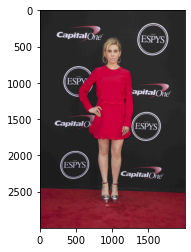

[0] neckline 
[1] dress 
[2] ruffle 
[3] shoe 
[4] sleeve 
**************************************************
**************************************************


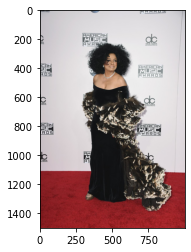

[0] neckline 
[1] coat 
[2] dress 
[3] shoe 
[4] sleeve 
**************************************************
**************************************************


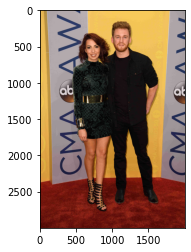

[0] neckline 
[1] dress 
[2] belt 
[3] shoe 
[4] sleeve 
**************************************************
**************************************************


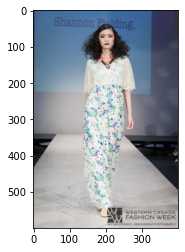

[0] top, t-shirt, sweatshirt 
[1] neckline 
[2] dress 
[3] shoe 
[4] sleeve 
**************************************************
**************************************************


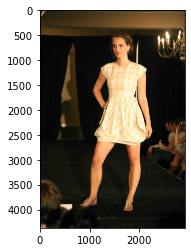

[0] neckline 
[1] dress 
[2] shoe 
[3] sleeve 
**************************************************


In [22]:
for i in range(5):
    x = np.random.randint(0,len(filtered_df),size=(1,))[0]
    ID = filtered_df['ImageId'].iloc[x]
    classes = filtered_df['SetClassId'].iloc[x]
    print('*'*50)
    plt.imshow(mpimg.imread(f'/Users/macbook/Desktop/Uni/Quarter 4/Deep Learning/Project/imaterialist-fashion-2020-fgvc7/train/{ID}.jpg'))
    plt.show()
    for j in range(len(classes)):
        print('[{}] {} '.format(j,names[classes[j]]))
    print('*'*50)
    

**************************************************


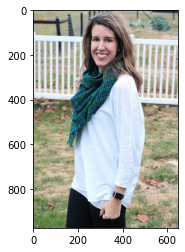

[0] top, t-shirt, sweatshirt 
[1] neckline 
[2] pants 
[3] watch 
[4] scarf 
[5] sleeve 
**************************************************
**************************************************


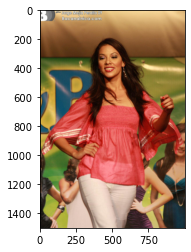

[0] top, t-shirt, sweatshirt 
[1] neckline 
[2] pants 
[3] sleeve 
**************************************************
**************************************************


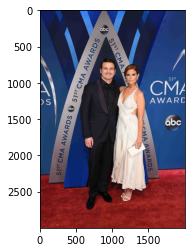

[0] pocket 
[1] shirt, blouse 
[2] jacket 
[3] pants 
[4] tie 
[5] shoe 
[6] collar 
[7] lapel 
[8] sleeve 
**************************************************
**************************************************


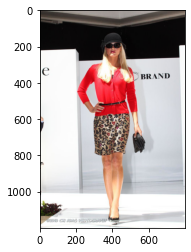

[0] neckline 
[1] buckle 
[2] cardigan 
[3] skirt 
[4] glasses 
[5] hat 
[6] belt 
[7] shoe 
[8] sleeve 
**************************************************
**************************************************


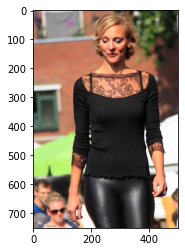

[0] neckline 
[1] pants 
[2] top, t-shirt, sweatshirt 
[3] sleeve 
**************************************************


In [28]:
for i in range(5):
    x = np.random.randint(0,len(other_df),size=(1,))[0]
    ID = other_df['ImageId'].iloc[x]
    classes = other_df['SetClassId'].iloc[x]
    print('*'*50)
    plt.imshow(mpimg.imread(f'/Users/macbook/Desktop/Uni/Quarter 4/Deep Learning/Project/imaterialist-fashion-2020-fgvc7/train/{ID}.jpg'))
    plt.show()
    for j in range(len(classes)):
        print('[{}] {} '.format(j,names[classes[j]]))
    print('*'*50)

# Adding Class Column

Dress = 1 and Non-Dress = 0

In [29]:
filtered_df["Class"]=1
other_df["Class"]=0

/var/folders/s5/4b25bvq14pqbm1qxsg0hhlr40000gn/T/ipykernel_9334/4009865848.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  filtered_df["Class"]=1
/var/folders/s5/4b25bvq14pqbm1qxsg0hhlr40000gn/T/ipykernel_9334/4009865848.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  other_df["Class"]=0


Choose a Sample of 8,000 row data

In [30]:
Sample_One=filtered_df.sample(n=4000, random_state=1)
Sample_Zero=other_df.sample(n=4000, random_state=1)

In [31]:
# Join the two DataFrames based on the 'ImageId' column
merged_df = pd.concat([Sample_One, Sample_Zero], sort=False)

# Print the merged DataFrame
merged_df

,ImageId,SetClassId,Ratio,Class
27728,9b01f757e9d3e3fc5e952777a96b4a89,"[33, 1, 10, 23, 31]",1.5,1
30430,aa5abdaffe018a1120b398c95b73421a,"[33, 10, 19]",1.5,1
40662,e4799cbf1636e0ba03ca83b6c6900376,"[33, 10, 23, 31]",1.5,1
6148,225817254a2f21bda925bdad41d98c10,"[33, 10, 15, 23, 31]",1.5,1
32577,b68ddc7f37b231502787fc8b1c02464c,"[1, 33, 10, 19, 28, 31]",1.5,1
...,...,...,...,...
37347,d1a26c080b2905f8349fcab2b8bae2d7,"[0, 6, 24, 28, 31]",1.5,0
18358,6735faf45054c79ad33b47ad53a629be,"[32, 0, 4, 6, 16, 18, 28, 29, 31]",1.5,0
43592,f5001c233ae05d4675e752b2d797f00a,"[32, 0, 4, 6, 16, 22, 23, 28, 29, 31]",1.5,0
37199,d0c14188313179dac499039ddc274bc1,"[33, 34, 35, 1, 8, 43, 19, 23]",1.5,0


In [32]:
from sklearn.model_selection import train_test_split

In [33]:
y_tc, y_test = train_test_split(merged_df, test_size=0.2, random_state=42)
y_train, y_cv = train_test_split(y_tc, test_size=0.25, random_state=42)

In [34]:
y_train = y_train.reset_index(drop=True)
y_test = y_test.reset_index(drop=True)
y_cv = y_cv.reset_index(drop=True)


In [35]:
h_num_px=60
w_num_px=int(h_num_px/1.5)

w_num_px

40

In [36]:
from PIL import Image
import numpy as np

# Initialize an empty array to hold the images
X_test = np.empty((0, h_num_px, w_num_px, 3), dtype=np.uint8)
Y_test = y_test.copy()
Drop_ID_test=[]


for ID in y_test["ImageId"]:
    try:
        # load image using PIL
        img = Image.open((f'/Users/macbook/Desktop/Uni/Quarter 4/Deep Learning/Project/imaterialist-fashion-2020-fgvc7/train/{ID}.jpg')).resize((w_num_px, h_num_px))
        # convert to numpy array
        img_array = np.asarray(img)
        array = np.expand_dims(img_array, axis=0)
        X_test = np.append(X_test, array, axis=0)
    except Exception as e:
        print(f"Error loading image {ID}: {e}")
        Drop_ID_test.append(ID)
        #Y_test.drop(Y_test[Y_test["ImageID"] == ID].index, inplace=True)


In [37]:
from PIL import Image
import numpy as np

# Initialize an empty array to hold the images
X_train = np.empty((0, h_num_px, w_num_px, 3), dtype=np.uint8)
Y_train = y_train.copy()
Drop_ID_train=[]

for ID in y_train["ImageId"]:
    try:
        # load image using PIL
        img = Image.open((f'/Users/macbook/Desktop/Uni/Quarter 4/Deep Learning/Project/imaterialist-fashion-2020-fgvc7/train/{ID}.jpg')).resize((w_num_px, h_num_px))
        # convert to numpy array
        img_array = np.asarray(img)
        array = np.expand_dims(img_array, axis=0)
        X_train = np.append(X_train, array, axis=0)
    except Exception as e:
        print(f"Error loading image {ID}: {e}")
        Drop_ID_train.append(ID)
        #y_train.drop(y_train[y_train['ImageID'] == ID].index, inplace=True)
        

Error loading image 4e11531bffbd53642119f548f31853dd: all the input arrays must have same number of dimensions, but the array at index 0 has 4 dimension(s) and the array at index 1 has 3 dimension(s)


In [38]:
from PIL import Image
import numpy as np

# Initialize an empty array to hold the images
X_cv = np.empty((0, h_num_px, w_num_px, 3), dtype=np.uint8)
Y_cv = y_cv.copy()
Drop_ID_cv=[]

for ID in y_cv["ImageId"]:
    try:
        # load image using PIL
        img = Image.open((f'/Users/macbook/Desktop/Uni/Quarter 4/Deep Learning/Project/imaterialist-fashion-2020-fgvc7/train/{ID}.jpg')).resize((w_num_px, h_num_px))
        # convert to numpy array
        img_array = np.asarray(img)
        array = np.expand_dims(img_array, axis=0)
        X_cv = np.append(X_cv, array, axis=0)
    except Exception as e:
        print(f"Error loading image {ID}: {e}")
        Drop_ID_cv.append(ID)
        #y_cv.drop(y_cv[y_cv['ImageID'] == ID].index, inplace=True)
        

In [39]:
for ID in Drop_ID_test:
    Y_test.drop(Y_test[Y_test["ImageId"] == ID].index, inplace=True)

for ID in Drop_ID_train:
    Y_train.drop(Y_train[Y_train['ImageId'] == ID].index, inplace=True)

for ID in Drop_ID_cv:
    Y_cv.drop(Y_cv[Y_cv['ImageId'] == ID].index, inplace=True)

train_set_y=np.array(Y_train["Class"])
test_set_y=np.array(Y_test["Class"])
cv_set_y=np.array(Y_cv["Class"])

In [40]:
print("train:",train_set_y.shape[0])
print("cv:", cv_set_y.shape[0])
print("test:",test_set_y.shape[0])

train: 4799
cv: 1600
test: 1600


In [38]:
#train_set_x_flatten = X_train.reshape(X_train.shape[0], -1).T
#test_set_x_flatten = X_test.reshape(X_test.shape[0], -1).T
#cv_set_x_flatten = X_cv.reshape(X_cv.shape[0], -1).T

In [41]:
train_set_x = X_train/255.
test_set_x = X_test/255.
cv_set_x = X_cv/255.

In [42]:
train_set_x.shape

(4799, 60, 40, 3)

Finding sample is random but as we want to have a fix data to work on here we upload the first sample that I saved before

In [43]:
import numpy as np

# load the text file into an array
np.save('/Users/macbook/Desktop/Uni/Quarter 4/Deep Learning/Project/Automatic-Image-Tagging-for-Fashion-E-commerce/train_set_x.npy', train_set_x)
np.save('/Users/macbook/Desktop/Uni/Quarter 4/Deep Learning/Project/Automatic-Image-Tagging-for-Fashion-E-commerce/test_set_x.npy', test_set_x)
np.save('/Users/macbook/Desktop/Uni/Quarter 4/Deep Learning/Project/Automatic-Image-Tagging-for-Fashion-E-commerce/cv_set_x.npy', cv_set_x)

np.save('/Users/macbook/Desktop/Uni/Quarter 4/Deep Learning/Project/Automatic-Image-Tagging-for-Fashion-E-commerce/train_set_y.npy', train_set_y)
np.save('/Users/macbook/Desktop/Uni/Quarter 4/Deep Learning/Project/Automatic-Image-Tagging-for-Fashion-E-commerce/test_set_y.npy', test_set_y)
np.save('/Users/macbook/Desktop/Uni/Quarter 4/Deep Learning/Project/Automatic-Image-Tagging-for-Fashion-E-commerce/cv_set_y.npy', cv_set_y)


In [139]:
train_set_y

array([0, 1, 1, ..., 1, 1, 1])

In [140]:
IDS

array(['96db731660e131aa46fa225a1658f4a4',
       'f14861197568fd42d5a3a8f39a8970b9',
       '7e58933676281110cd77eeee888323b3', ...,
       'a92758f484ed7a09428737b958db3556',
       'd2eacfb360d79a0d79ba9bc401f16be6',
       '95d959735c05e35f7905ada1e39f35f4'], dtype=object)

In [138]:
IDS=np.array(Y_train["ImageId"])
np.save('/Users/macbook/Desktop/Uni/Quarter 4/Deep Learning/Project/Automatic-Image-Tagging-for-Fashion-E-commerce/IDs.npy', IDS)


In [74]:
train_df=df

In [93]:
def create_mask(size):
    image_ids = train_df['ImageId'].unique()[:size]
    images_meta=[]

    for i in range(12):
        x = np.random.randint(0,len(other_df),size=(1,))[0]
        image_id = other_df['ImageId'].iloc[x]
        img = mpimg.imread(f'/Users/macbook/Desktop/Uni/Quarter 4/Deep Learning/Project/imaterialist-fashion-2020-fgvc7/train/{image_id}.jpg')
        images_meta.append({
            'image': img,
            'shape': img.shape,
            'encoded_pixels': train_df[train_df['ImageId'] == image_id]['EncodedPixels'],
            'class_ids':  train_df[train_df['ImageId'] == image_id]['ClassId']
        })

    masks = []
    for image in images_meta:
        shape = image.get('shape')
        encoded_pixels = list(image.get('encoded_pixels'))
        class_ids = list(image.get('class_ids'))
        
        # Initialize numpy array with shape same as image size
        height, width = shape[:2]
        mask = np.zeros((height, width)).reshape(-1)
        
        # Iterate over encoded pixels and create mask
        for segment, (pixel_str, class_id) in enumerate(zip(encoded_pixels, class_ids)):
            splitted_pixels = list(map(int, pixel_str.split()))
            pixel_starts = splitted_pixels[::2]
            run_lengths = splitted_pixels[1::2]
            assert max(pixel_starts) < mask.shape[0]
            for pixel_start, run_length in zip(pixel_starts, run_lengths):
                pixel_start = int(pixel_start) - 1
                run_length = int(run_length)
                mask[pixel_start:pixel_start+run_length] = 255 - class_id * 4
        masks.append(mask.reshape((height, width), order='F'))  # https://stackoverflow.com/questions/45973722/how-does-numpy-reshape-with-order-f-work
    return masks, images_meta

In [94]:
def plot_segmented_images(size=12, figsize=(14, 14)):
    # First create masks from given segments
    masks, images_meta = create_mask(size)
    
    # Plot images in groups of 4 images
    n_groups = 4
    
    count = 0
    for index in range(size // 4):
        fig, ax = plt.subplots(nrows=2, ncols=2, figsize=figsize)
        for row in ax:
            for col in row:
                col.imshow(images_meta[count]['image'])
                col.imshow(masks[count], alpha=0.75)
                col.axis('off')
                count += 1
        plt.show()
    gc.collect()

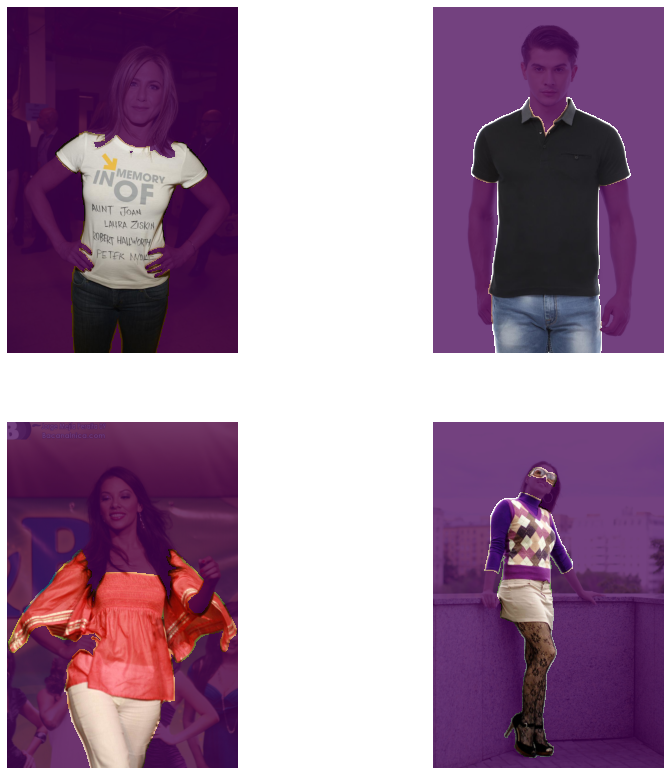

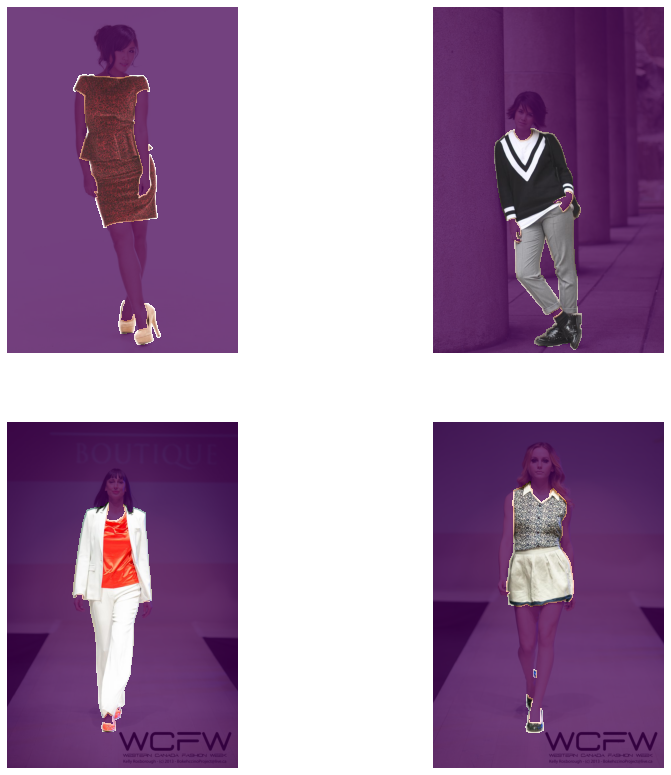

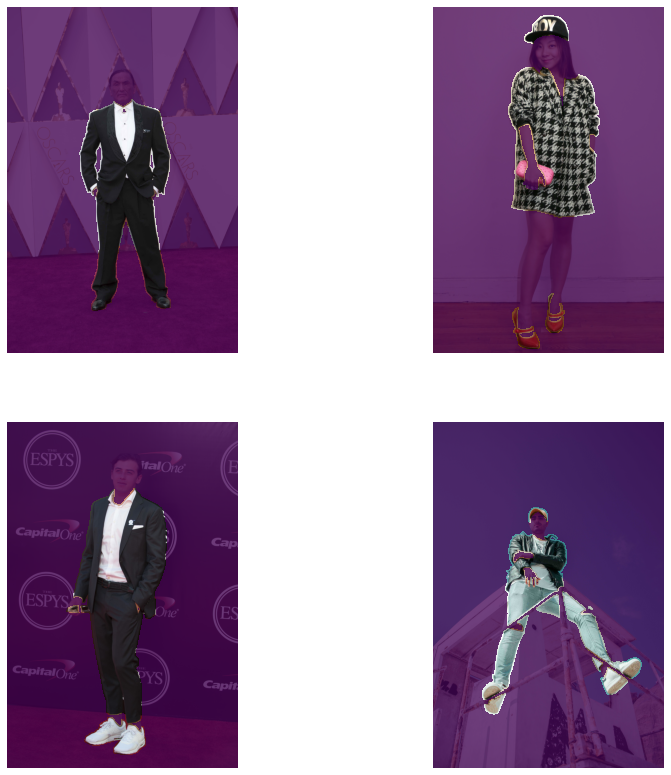

In [95]:
plot_segmented_images()


[]

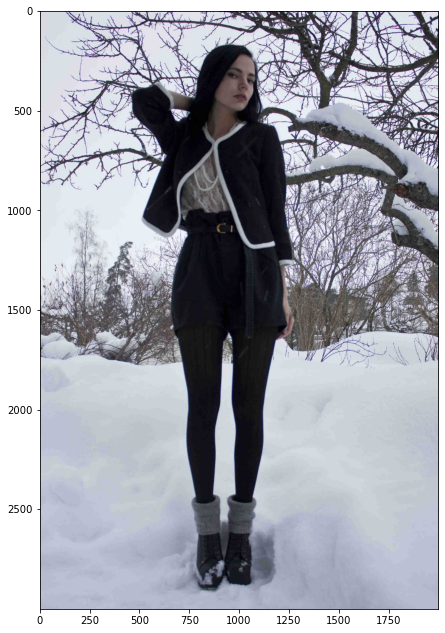

In [96]:
#IMAGE_ID = 'a46472cfb7ebcab5c8dd2abcbef4e83e'

x = np.random.randint(0,len(other_df),size=(1,))[0]
IMAGE_ID = other_df['ImageId'].iloc[x]

plt.figure(figsize = (110,11))
image = mpimg.imread(f'/Users/macbook/Desktop/Uni/Quarter 4/Deep Learning/Project/imaterialist-fashion-2020-fgvc7/train/{IMAGE_ID}.jpg')
plt.grid(False)
plt.imshow(image)
plt.plot()

In [97]:
category_map, attribute_map = {}, {}
for cat in label_desc.get('categories'):
    category_map[cat.get('id')] = cat.get('name')
for attr in label_desc.get('attributes'):
    attribute_map[attr.get('id')] = attr.get('name')

In [98]:
train_df['ClassId'] = train_df['ClassId'].map(category_map)
train_df['ClassId'] = train_df['ClassId'].astype('category')

In [99]:
# Get the an image id given in the training set for visualization
vis_df = train_df[train_df['ImageId'] == IMAGE_ID]
vis_df['ClassId'] = vis_df['ClassId'].cat.codes
vis_df = vis_df.reset_index(drop=True)
vis_df

/var/folders/s5/4b25bvq14pqbm1qxsg0hhlr40000gn/T/ipykernel_9334/3327108218.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  vis_df['ClassId'] = vis_df['ClassId'].cat.codes


,ImageId,EncodedPixels,Height,Width,ClassId,AttributesIds,Ratio
0,a46472cfb7ebcab5c8dd2abcbef4e83e,2106948 10 2109944 30 2112941 49 2115937 69 21...,3000,2000,-1,"115,146,295,301",1.5
1,a46472cfb7ebcab5c8dd2abcbef4e83e,1368421 16 1371411 39 1374410 53 1377409 67 13...,3000,2000,-1,"115,146,225,295,311,317",1.5
2,a46472cfb7ebcab5c8dd2abcbef4e83e,1368421 16 1371411 35 1374410 46 1377409 56 13...,3000,2000,-1,159,1.5
3,a46472cfb7ebcab5c8dd2abcbef4e83e,3282732 31 3285728 67 3288724 76 3291721 84 32...,3000,2000,-1,"159,204",1.5
4,a46472cfb7ebcab5c8dd2abcbef4e83e,1599992 4 1602991 9 1605991 9 1608990 11 16119...,3000,2000,-1,NaN,1.5
5,a46472cfb7ebcab5c8dd2abcbef4e83e,3231931 3 3234931 10 3237931 14 3240931 17 324...,3000,2000,-1,NaN,1.5
6,a46472cfb7ebcab5c8dd2abcbef4e83e,2427589 1 2430589 3 2433588 5 2436588 7 243958...,3000,2000,-1,183,1.5
7,a46472cfb7ebcab5c8dd2abcbef4e83e,1966472 54 1969418 113 1972411 125 1975405 137...,3000,2000,-1,"50,115,136,142,149,234,295,316,317",1.5
8,a46472cfb7ebcab5c8dd2abcbef4e83e,2203095 4 2206095 11 2209094 19 2212094 25 221...,3000,2000,-1,NaN,1.5
9,a46472cfb7ebcab5c8dd2abcbef4e83e,2653090 5 2656083 15 2659079 22 2662077 27 266...,3000,2000,-1,NaN,1.5


In [100]:
segments = list(vis_df['EncodedPixels'])
class_ids = list(vis_df['ClassId'])
masks = []
for segment, class_id in zip(segments, class_ids):
    
    height = vis_df['Height'][0]
    width = vis_df['Width'][0]
    # Initialize empty mask
    mask = np.zeros((height, width)).reshape(-1)
    
    # Iterate over encoded pixels and create mask
    splitted_pixels = list(map(int, segment.split()))
    pixel_starts = splitted_pixels[::2]
    run_lengths = splitted_pixels[1::2]
    assert max(pixel_starts) < mask.shape[0]
    for pixel_start, run_length in zip(pixel_starts, run_lengths):
        pixel_start = int(pixel_start) - 1
        run_length = int(run_length)
        mask[pixel_start:pixel_start+run_length] = 255 - class_id * 4

    mask = mask.reshape((height, width), order='F')
    masks.append(mask)

In [101]:
def plot_individual_segment(*masks, image, figsize=(110, 11)):
    plt.figure(figsize = figsize)
    plt.imshow(image)
    for mask in masks:
        plt.imshow(mask, alpha=0.6)
    plt.axis('off')
    plt.show()

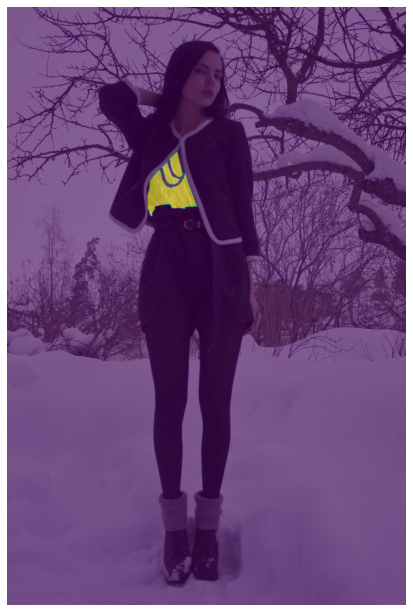

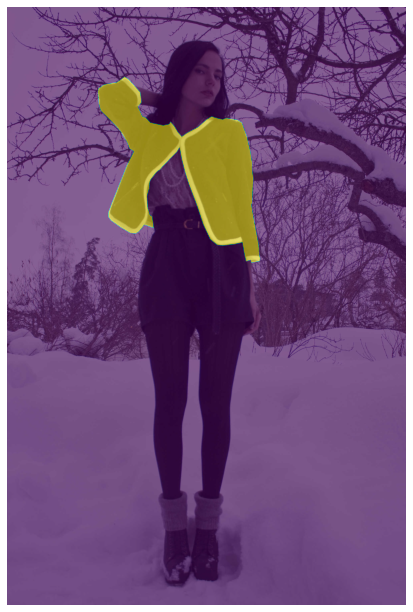

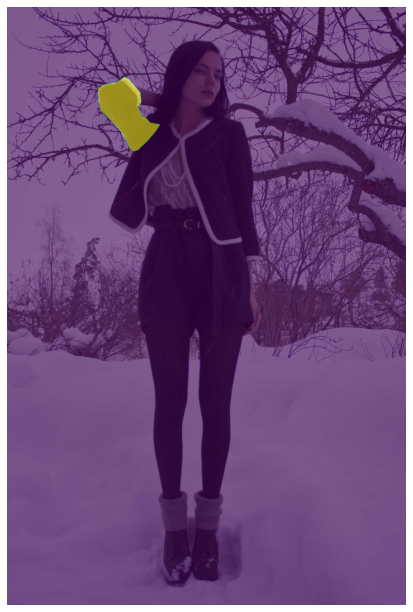

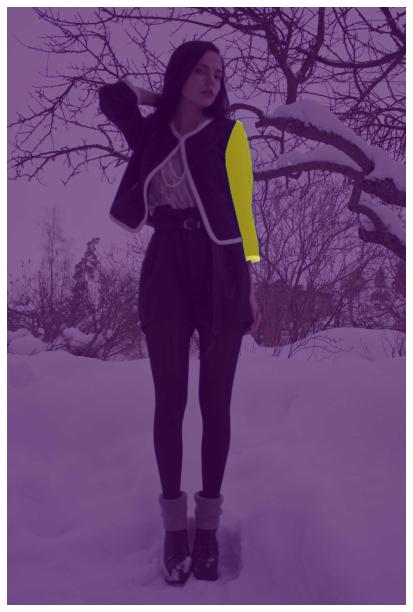

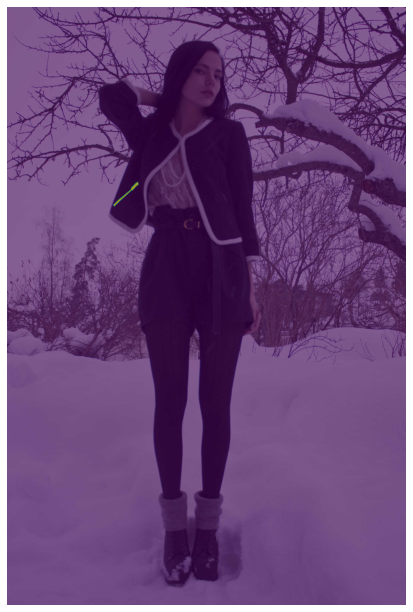

...

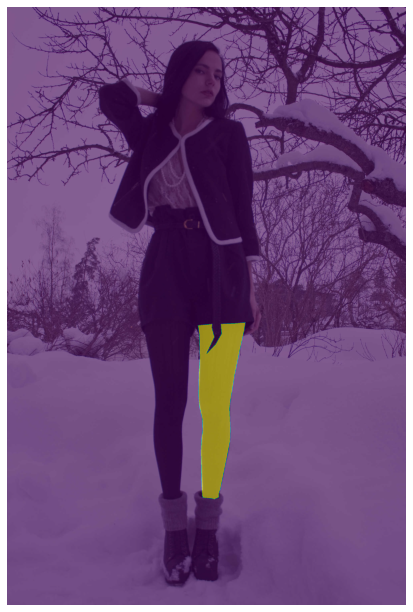

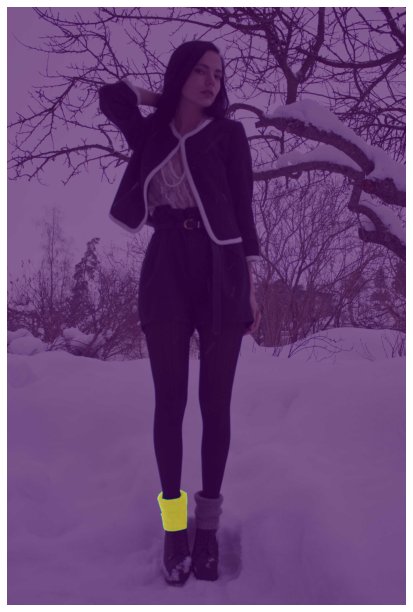

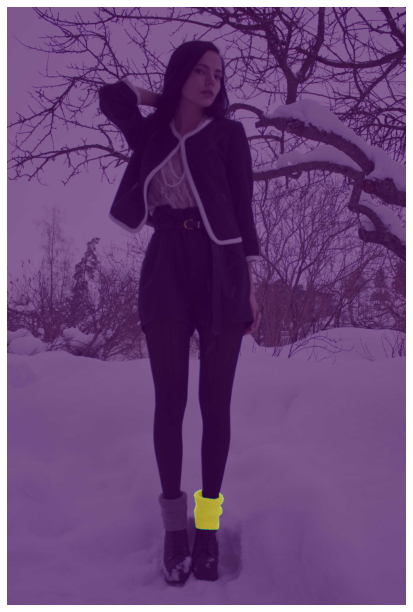

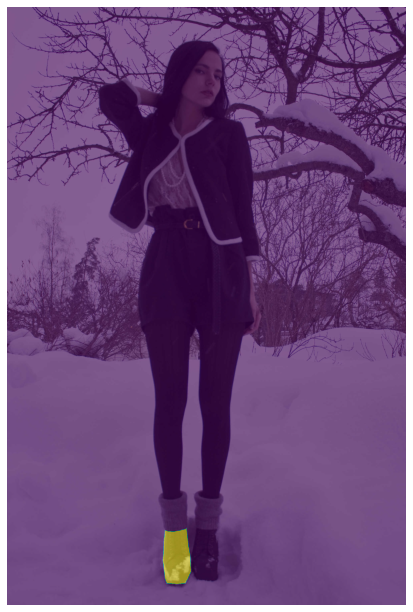

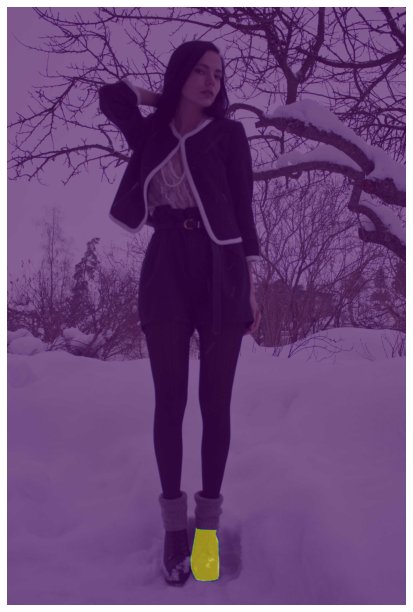

In [123]:
for i in range(16):
    plot_individual_segment(masks[i], image=image)


where y_true is 1 but y_pred is 0


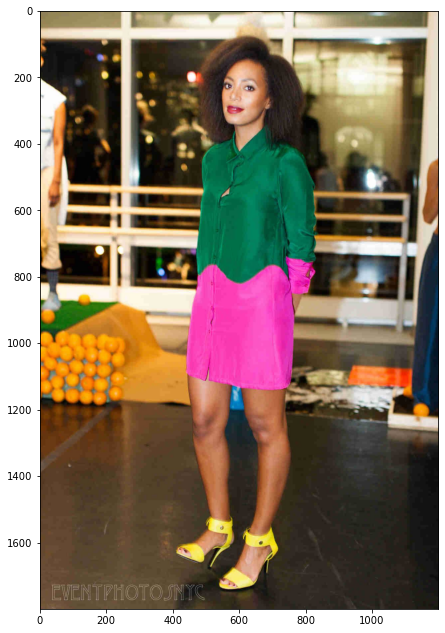

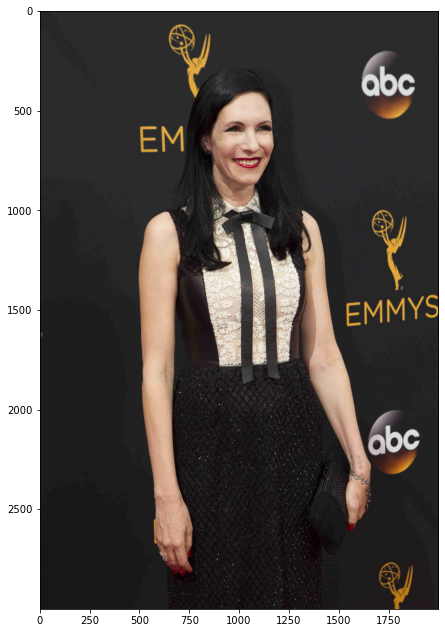

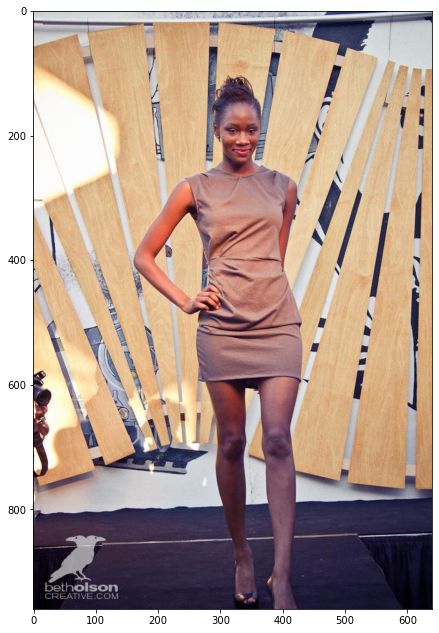

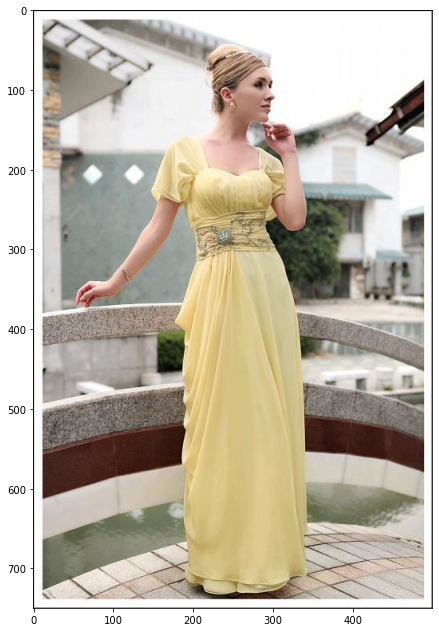

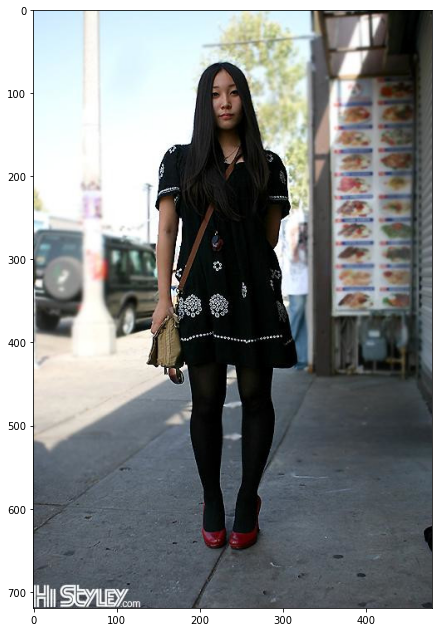

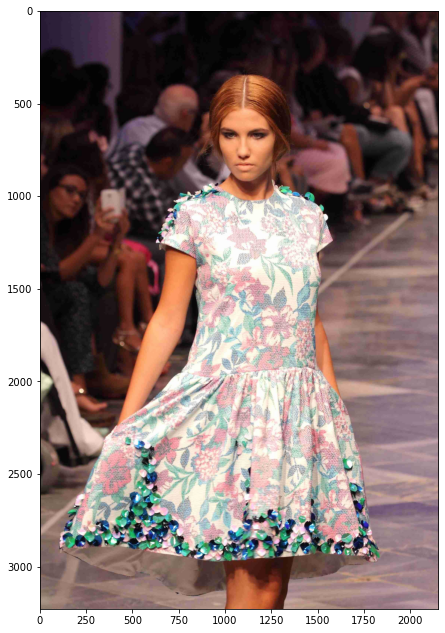

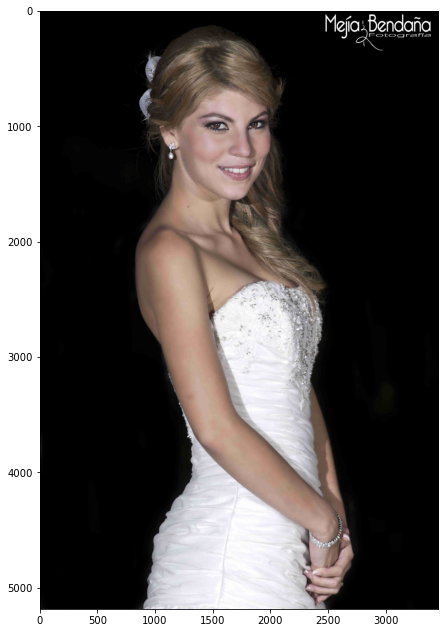

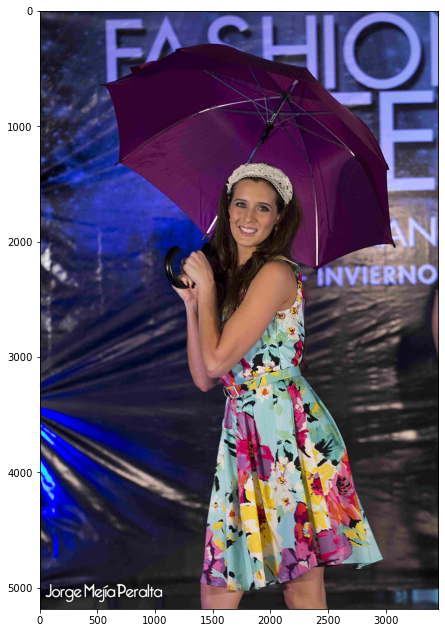

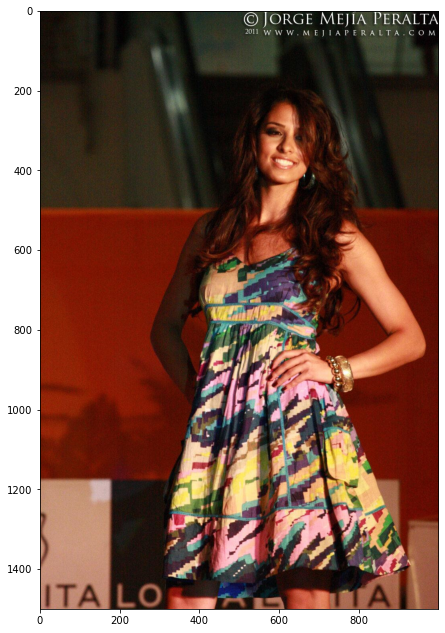

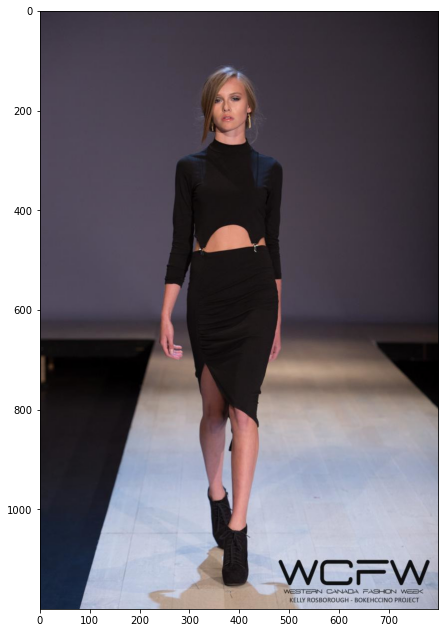

In [163]:
print("where y_true is 1 but y_pred is 0")
Im=['945af140589c3c9ed0f00fee605950ee', 'c28fd5eca1946294a38a25227a53f43b',
 '12bf5140bf5bc1cf7c8f3f0910102e5f' ,'2729bbf0c38b2d1a91f125625c86cfc3',
 'd55de68d051a0fc573e63600d182d105', '18e3c4469bb9963ba84d36e75c553a87',
 '8e39e0a2ec8fc4deb9d6303981f28783' ,'606cb1db7c6477200e1b3e7051a0506b',
 '1d58e593ae9c31e0cfaff439561d0218' ,'400e03c601d55fc10588c61f11dd8a27']

for IMAGE_ID in Im:


    plt.figure(figsize = (110,11))
    image = mpimg.imread(f'/Users/macbook/Desktop/Uni/Quarter 4/Deep Learning/Project/imaterialist-fashion-2020-fgvc7/train/{IMAGE_ID}.jpg')
    plt.grid(False)
    plt.imshow(image)
    plt.plot()


where y_true is 0 but y_pred is 1


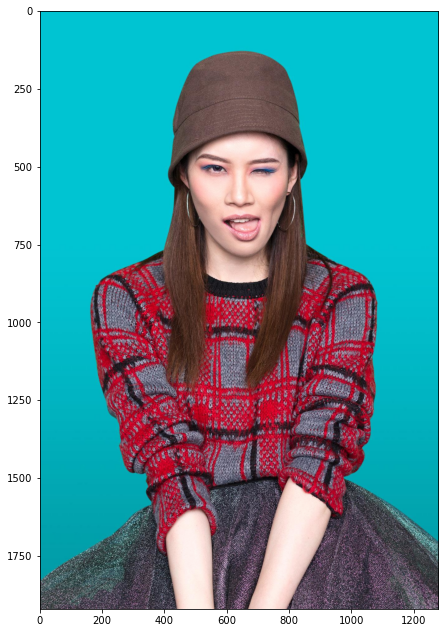

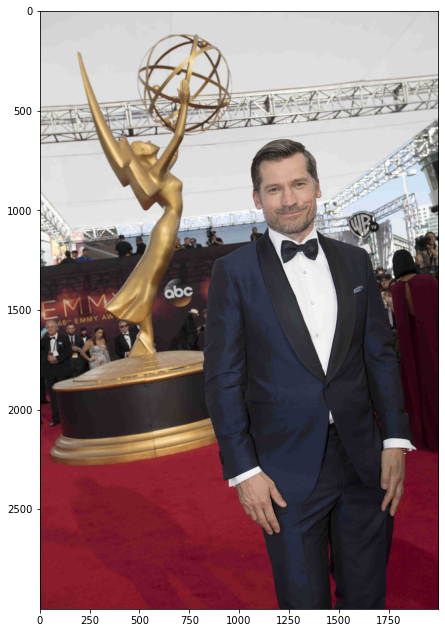

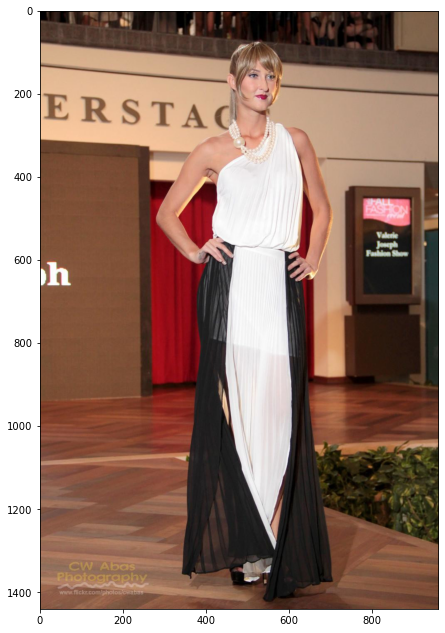

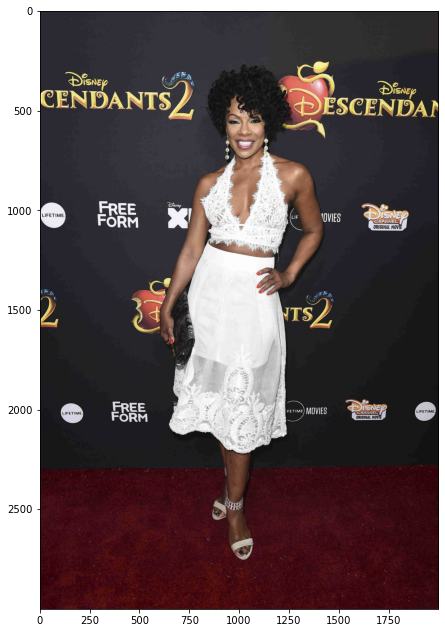

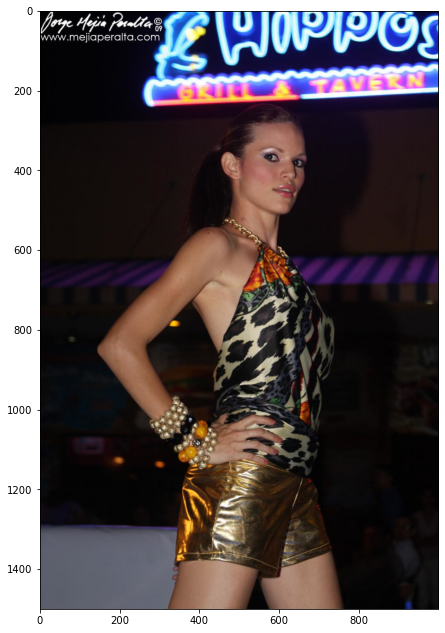

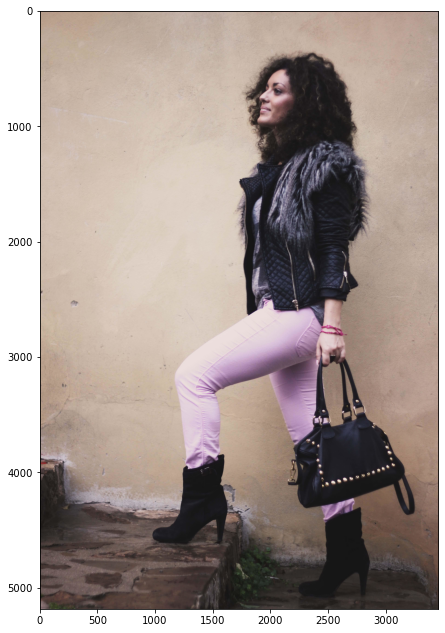

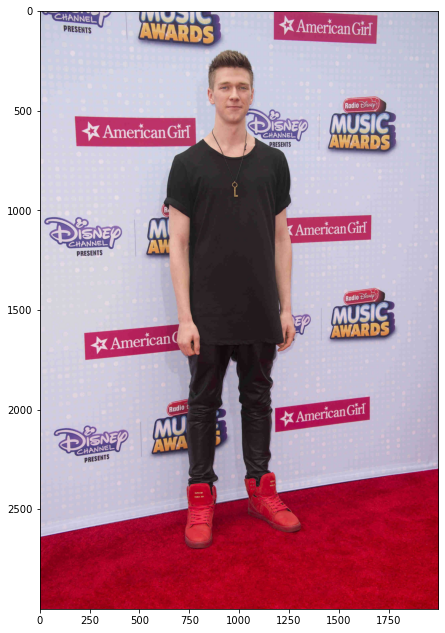

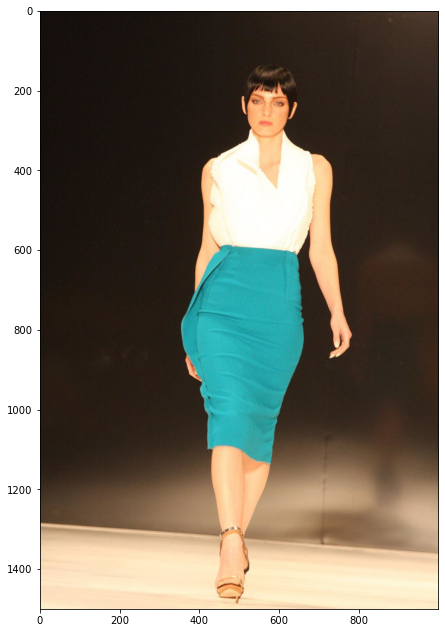

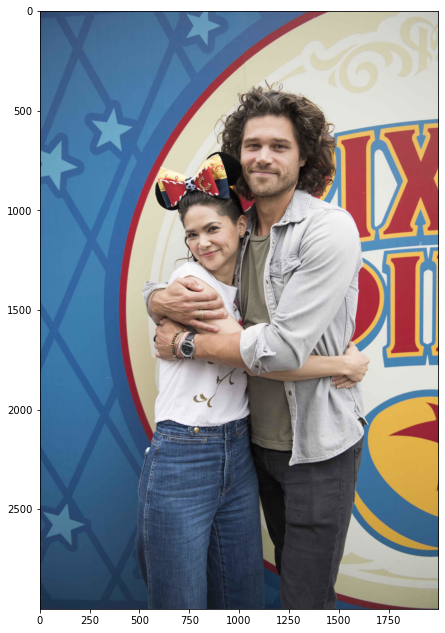

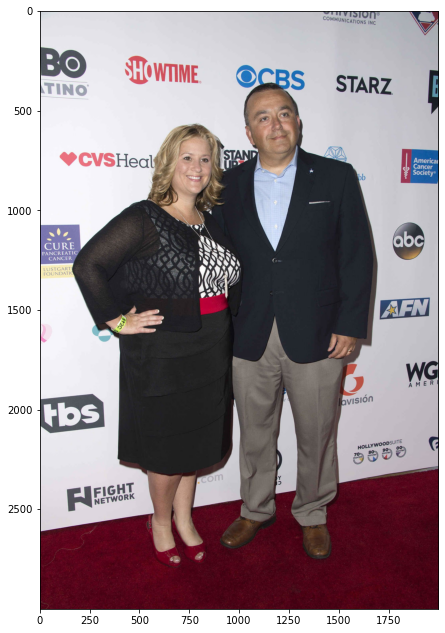

In [164]:
print("where y_true is 0 but y_pred is 1")
Im=['600fc127f6e6583900c9406529dbc392', '21ba91a7fa7188bad1142e2c115cc668',
 '5de17494eea46c4395aa33cf84095ba1', 'db2722294c8006abe3f0dad5a9955efc',
 'e33ce5dee1109ca0be04edfce80bd1f9', '69f5391f0ff310390c94aa140ea579d4',
 '6d8a63b6a48c6c6ccdd339c1dc2eaee6' ,'32475f420ea68f0c3532bdb4a39a5c03',
 'f2fe8d71814945eeeabb1886240bedaf' ,'b940c58a356266876bc118b27b52c5d4']

for IMAGE_ID in Im:


    plt.figure(figsize = (110,11))
    image = mpimg.imread(f'/Users/macbook/Desktop/Uni/Quarter 4/Deep Learning/Project/imaterialist-fashion-2020-fgvc7/train/{IMAGE_ID}.jpg')
    plt.grid(False)
    plt.imshow(image)
    plt.plot()
